<h1 style='text-align: center;'>- Desafio Filterfeed -</h1>

<b>Created by:</b> Antônio Vinicius

<b>Github:</b> [antonio-vmoura](https://github.com/antonio-vmoura)

<b>Desafio:</b> Dado que o cliente “Lojas Renner” é aquele que melhor sirvo, qual seria o próximo prospect que devo abordar dentre uma lista x de targets, com base na semelhança de interesses?

## Sumário

1. Iniciando o notebook
2. Análise exploratória
3. Pré-processamento
4. Algoritmo da similaridade
5. Meus Insights
6. Conclusão

## 1- Iniciando o notebook

### 1.1- Importação das bibliotecas

In [5]:
import sys #sistema

In [6]:
import pandas as pd #analise de dados

In [7]:
import numpy as np #valores numericos

In [8]:
import spacy as sp #processamento de linguagem natural
from spacy.lang.pt.stop_words import STOP_WORDS #lista das stopwords mais comuns

In [9]:
import nltk #processamento de texto
from nltk.tokenize import WordPunctTokenizer #Retorna os tokens de uma string
from nltk.corpus import stopwords #importando stopwords
from nltk.stem import RSLPStemmer #Removedor de Sufixos

In [10]:
from wordcloud import WordCloud #grafico de nuvem

In [11]:
import matplotlib.pyplot as plt #visualizacao
import plotly.express as px #graficos interativos
import seaborn as sns #graficos

In [12]:
import re #expressões regulares

In [13]:
import json
from sklearn.feature_extraction.text import TfidfVectorizer #converte documentos para usar no tfidf
from string_grouper import match_strings, match_most_similar, group_similar_strings, StringGrouper #localiza strings semelhantes

### 1.2- Ambiente

In [14]:
print("Python version:", sys.version)
print("\nPandas version:", pd.__version__)
print("\nNumpy version:", np.__version__)

Python version: 3.8.5 (default, Jul 20 2020, 19:48:14) 
[GCC 7.5.0]

Pandas version: 1.1.1

Numpy version: 1.19.1


### 1.3- Funções

In [15]:
nlp = sp.load("pt_core_news_sm")

In [16]:
#Traca a distribuicao dos 50 principais termos agrupados por classe gramatical e plota o grafico
def plot_term_scatter(df, text_variable, title='Frequência das Keywords (Agrupadas por classe gramatical)'):
    text = df[text_variable].str.cat(sep=" ")
    words = WordPunctTokenizer().tokenize(text) #convertendo words em tokens
    
    top_words = pd.Series(words).value_counts().nlargest(100) #selecionando os 50 termos
    words_df = top_words.rename_axis('words').reset_index(name='count')
    words_df['pos'] = [nlp(word)[0].pos_ for word in words_df['words']] #classe gramatical

    fig = px.scatter(words_df, 
                     x='words', 
                     y='count', 
                     color='pos', 
                     labels={'words':'Keywords',
                             'count': 'Frequência',
                             'pos': 'Part-of-speech'
                            }, 
                     marginal_y='rug',
                     title=title
                    )
    fig.update_layout(xaxis_tickangle=45, xaxis_categoryorder = 'total descending')
    fig.show('notebook')
    return pd.concat([words_df.head(),words_df.tail()]) #imprimindo as primeiras e ultimas palavras com pos


In [17]:
#plota um grafico de nuvem
def plot_wordcloud(df_column):
    text = df_column.str.cat(sep=" ")
    
    wordcloud = WordCloud(
        max_words=100,
        width=900,
        height=500,
        max_font_size=350,
        collocations=False,
        normalize_plurals=False,
        background_color='white',
        prefer_horizontal=1
    ).generate(text)
    plt.figure(figsize=(20, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


In [18]:
#stemming   
def stem_words(text):    
    tokenizer = WordPunctTokenizer()
    stemmer = RSLPStemmer()
    words = tokenizer.tokenize(text)
    stemmed_words = map(lambda word : stemmer.stem(word), words)

    return ' '.join(stemmed_words)


In [19]:
#lemmatization
def lem_words(text):
    
    doc = nlp(text)
    lemmatized_doc = " ".join([word.lemma_ for word in doc])
    
    return lemmatized_doc


In [20]:
#transformando o dataframe em uma lista
def make_list(i):
    key_list = str(data['all_keywords'][i].tolist())
    key_list = re.sub(r'\[|\'|\,|\]', '', key_list).strip().lower()

    return key_list.split()


In [21]:
def remove_duplicates(slice_list):
    return list(dict.fromkeys(slice_list))


In [54]:
#calcula a semelhança entre as keywords
def group_similar(names_list):
    ser = pd.Series(names_list)
    string_grouper = StringGrouper(ser)
    string_grouper = string_grouper.fit()
    match_similar = group_similar_strings(ser,min_similarity=0.5)
    similar = match_similar.unique()
    no_similar_list = similar.tolist()
    return no_similar_list


In [23]:
def _pos_tags(corpi_string):
    corpi_string_str = str(corpi_string)

    doc = nlp(corpi_string_str)

    res = []
    
    for token in doc:
        if token.pos_ == "NOUN" and not token.text in res: #ou token.pos_ == "PROPN"
            res.append(token.text) #acrescentando os resultados filtrados
            json_res = json.dumps(res)

    return res


In [55]:
def run_tfidf(corpus):
    vectorizer = TfidfVectorizer(max_features=25,stop_words='english',ngram_range=(1,1),use_idf=True, smooth_idf=True,norm='l2')
    if corpus is None:
        return
    else:
        Vector = vectorizer.fit_transform(corpus)
        keyword_features = (vectorizer.get_feature_names())
        keyword_pos = _pos_tags(keyword_features)
        no_duplicates = remove_duplicates(keyword_pos)
        deduplication = group_similar(no_duplicates)
        final_slice_of_features = deduplication[:15] #pega somente as 15 primeiras
        
        string_of_slice = final_slice_of_features
        return string_of_slice


## 2- Análise exploratória

### 2.1- Leitura dos dados

In [25]:
#substituindo as aspas simples para duplas do client

arquivo = open('./assets/client.json', 'r')
data_client = arquivo.read()
arquivo.close()

data_client = data_client.replace("\'", "\"")

arquivo = open('./assets/client.json', 'w')
arquivo.write(data_client)
arquivo.close()

#substituindo as aspas simples para duplas dos targets

arquivo = open('./assets/targets.json', 'r')
data_targets = arquivo.read()
arquivo.close()

data_targets = data_targets.replace("\'", "\"")

arquivo = open('./assets/targets.json', 'w')
arquivo.write(data_targets)
arquivo.close()

In [26]:
client = pd.read_json(path_or_buf = './assets/client.json', orient = 'index').transpose()

In [27]:
targets = pd.read_json(path_or_buf = './assets/targets.json', orient = 'records')

### 2.2- Análise dos dados

In [28]:
client.info() #printando informacoes do client

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   entity_name  1 non-null      object
 1   keywords     1 non-null      object
dtypes: object(2)
memory usage: 144.0+ bytes


In [29]:
targets.info() #printando informacoes do targets

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   entity_name  7 non-null      object
 1   keywords     7 non-null      object
dtypes: object(2)
memory usage: 240.0+ bytes


In [30]:
client_targets = (pd.concat([client, targets], ignore_index = True))
client_targets.head(len(client_targets))

,entity_name,keywords
0,Lojas Renner,"[acoes, alegre, capital, carteira, economia, g..."
1,Lojas Leader,"[btg, comercio, confira, diario, economia, ext..."
2,Magazine Luiza,"[bolsa, digital, economia, epoca, exame, helen..."
3,Leroy Merlin,"[abre, campo, campograndenews, casa, construca..."
4,Hortifruti Natural da Terra,"[agroemdia, agrolink, campanha, carne, deliver..."
5,Sodimac,"[chile, colombia, construcao, decoracao, dicic..."
6,PepsiCo,"[abre, alimentos, bebidas, concursos, emprego,..."
7,Arezzo,"[apresenta, arezzo, castiglion, chiana, econom..."


In [31]:
data = pd.concat([ #contatenando os keywords de client com os do targets
    client[['keywords']].rename(columns={'keywords':"all_keywords"}), 
    targets[['keywords']].rename(columns={'keywords':"all_keywords"})
], ignore_index = True)

data = data.explode('all_keywords') #dividindo as keywords em linhas
data.head()

,all_keywords
0,acoes
0,alegre
0,capital
0,carteira
0,economia


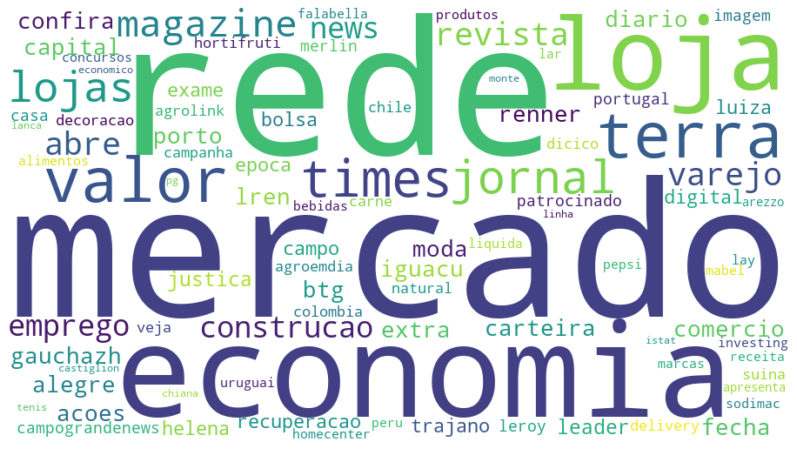

In [32]:
plot_wordcloud(data['all_keywords']) #grafico em nuvem dos dados originais

In [33]:
plot_term_scatter(data, 'all_keywords') #grafico da frequencia dos dados originais

,words,count,pos
0,mercado,4,NOUN
1,rede,4,NOUN
2,valor,3,NOUN
3,terra,3,NOUN
4,loja,3,NOUN
86,economico,1,ADJ
87,gauchazh,1,PROPN
88,patrocinado,1,VERB
89,agroemdia,1,VERB
90,mabel,1,PROPN


## 3- Pré-processamento

### 3.1 - Removendo Stopwords

In [34]:
nltk.download('stopwords', quiet=True)

stopwords_set = set(STOP_WORDS).union(set(stopwords.words('portuguese')))
    
print("Lista das stopwords em português: ", sorted(list(stopwords_set)))

Lista das stopwords em português:  ['a', 'acerca', 'ademais', 'adeus', 'agora', 'ainda', 'algo', 'algumas', 'alguns', 'ali', 'além', 'ambas', 'ambos', 'antes', 'ao', 'aos', 'apenas', 'apoia', 'apoio', 'apontar', 'após', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aqui', 'aquilo', 'as', 'assim', 'através', 'atrás', 'até', 'aí', 'baixo', 'bastante', 'bem', 'boa', 'bom', 'breve', 'cada', 'caminho', 'catorze', 'cedo', 'cento', 'certamente', 'certeza', 'cima', 'cinco', 'coisa', 'com', 'como', 'comprida', 'comprido', 'conhecida', 'conhecido', 'conselho', 'contra', 'contudo', 'corrente', 'cuja', 'cujo', 'custa', 'cá', 'da', 'daquela', 'daquele', 'dar', 'das', 'de', 'debaixo', 'dela', 'delas', 'dele', 'deles', 'demais', 'dentro', 'depois', 'des', 'desde', 'dessa', 'desse', 'desta', 'deste', 'deve', 'devem', 'deverá', 'dez', 'dezanove', 'dezasseis', 'dezassete', 'dezoito', 'diante', 'direita', 'disso', 'diz', 'dizem', 'dizer', 'do', 'dois', 'dos', 'doze', 'duas', 'dá', 'dão', 'e', 'ela', 'elas',

In [35]:
#retirando as stopwords e criando uma nova coluna no dataframe

pattern = r'\b(?:{})\b'.format('|'.join(stopwords_set))

data['without_stopwords'] = data['all_keywords'].str.replace(pattern, '')
data['without_stopwords'] = data['without_stopwords'].str.replace(r'\d+', '')
data['without_stopwords'] = data['without_stopwords'].str.replace(r'\s+|\n',' ').str.strip()

data.head()

,all_keywords,without_stopwords
0,acoes,acoes
0,alegre,alegre
0,capital,capital
0,carteira,carteira
0,economia,economia


### 3.2 - Stemming

In [36]:
nltk.download('rslp', quiet=True)

data['data_stemmed'] = data['all_keywords'].apply(stem_words)

data.head()

,all_keywords,without_stopwords,data_stemmed
0,acoes,acoes,aco
0,alegre,alegre,alegr
0,capital,capital,capit
0,carteira,carteira,cart
0,economia,economia,econom


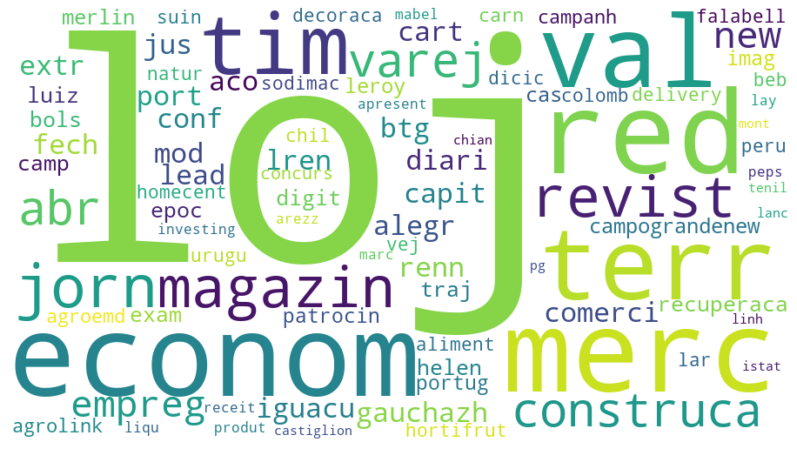

In [37]:
plot_wordcloud(data['data_stemmed']) ##grafico em nuvem do radical dos dados

In [38]:
plot_term_scatter(data, 'data_stemmed') #grafico da frequencia com os dados no radical

,words,count,pos
0,loj,5,PROPN
1,red,4,ADJ
2,econom,4,VERB
3,merc,4,PROPN
4,terr,3,NOUN
84,istat,1,PROPN
85,marc,1,PROPN
86,colomb,1,PROPN
87,vej,1,INTJ
88,natur,1,PROPN


### 3.2 - Lemmatization

In [39]:
data['lemmatized_keywords'] = data['all_keywords'].apply(lem_words)

data.head()

,all_keywords,without_stopwords,data_stemmed,lemmatized_keywords
0,acoes,acoes,aco,acoes
0,alegre,alegre,alegr,alegrar
0,capital,capital,capit,capital
0,carteira,carteira,cart,carteiro
0,economia,economia,econom,economia


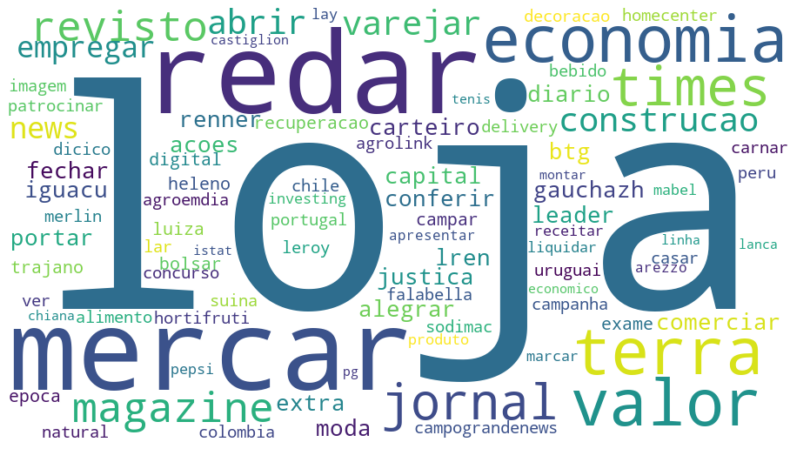

In [40]:
plot_wordcloud(data['lemmatized_keywords']) ##grafico em nuvem dos dados lematizados

In [41]:
plot_term_scatter(data, 'lemmatized_keywords') #grafico da frequencia dos dados lematizados

,words,count,pos
0,loja,5,NOUN
1,redar,4,VERB
2,mercar,4,VERB
3,economia,3,NOUN
4,terra,3,NOUN
85,receitar,1,VERB
86,trajano,1,PROPN
87,dicico,1,ADJ
88,colombia,1,VERB
89,alimento,1,NOUN


### 3.3 - Tf–idf

In [42]:
new_client_targets = client_targets.copy() #copiando a lista para substituir as keywords

#keywords(make_list(x)) -> joga dentro da def run_tfidf a linha x de data['all_keywords'] convertido em lista
#new_client_targets recebe as linhas da keywords atualizadas com o tf-idf aplicado
new_client_targets['keywords'] = [(run_tfidf(make_list(x))) for x in range(0, len(new_client_targets))]

print('Verificando se as keywords são iguais:\n')
print(new_client_targets['keywords'] == client_targets['keywords'])

Verificando se as keywords são iguais:

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
Name: keywords, dtype: bool


In [43]:
client_targets.head(10) #dataframe antes de passar pela def run_tfidf

,entity_name,keywords
0,Lojas Renner,"[acoes, alegre, capital, carteira, economia, g..."
1,Lojas Leader,"[btg, comercio, confira, diario, economia, ext..."
2,Magazine Luiza,"[bolsa, digital, economia, epoca, exame, helen..."
3,Leroy Merlin,"[abre, campo, campograndenews, casa, construca..."
4,Hortifruti Natural da Terra,"[agroemdia, agrolink, campanha, carne, deliver..."
5,Sodimac,"[chile, colombia, construcao, decoracao, dicic..."
6,PepsiCo,"[abre, alimentos, bebidas, concursos, emprego,..."
7,Arezzo,"[apresenta, arezzo, castiglion, chiana, econom..."


In [44]:
new_client_targets.head(10) #dataframe depois de passar pela def run_tfidf

,entity_name,keywords
0,Lojas Renner,"[acoes, capital, carteira, economia, loja, lre..."
1,Lojas Leader,"[btg, comercio, confira, diario, economia, fec..."
2,Magazine Luiza,"[bolsa, economia, epoca, exame, lojas, luiza, ..."
3,Leroy Merlin,"[campo, campograndenews, casa, construcao, emp..."
4,Hortifruti Natural da Terra,"[agrolink, campanha, carne, jornal, mercado, r..."
5,Sodimac,"[construcao, decoracao, lar, loja, mercado, pe..."
6,PepsiCo,"[alimentos, bebidas, concursos, emprego, liqui..."
7,Arezzo,"[arezzo, castiglion, istat, linha, news, revis..."


In [45]:
#separando o data frame em client e targets novamente

client = new_client_targets.loc[:0] #linha 0 e a pertencente ao cliente
targets = new_client_targets.loc[1:].reset_index() #demais linhas sao os targets

In [46]:
client.head()

,entity_name,keywords
0,Lojas Renner,"[acoes, capital, carteira, economia, loja, lre..."


In [47]:
targets.head(len(targets))

,index,entity_name,keywords
0,1,Lojas Leader,"[btg, comercio, confira, diario, economia, fec..."
1,2,Magazine Luiza,"[bolsa, economia, epoca, exame, lojas, luiza, ..."
2,3,Leroy Merlin,"[campo, campograndenews, casa, construcao, emp..."
3,4,Hortifruti Natural da Terra,"[agrolink, campanha, carne, jornal, mercado, r..."
4,5,Sodimac,"[construcao, decoracao, lar, loja, mercado, pe..."
5,6,PepsiCo,"[alimentos, bebidas, concursos, emprego, liqui..."
6,7,Arezzo,"[arezzo, castiglion, istat, linha, news, revis..."


In [48]:
data = pd.concat([ #contatenando os keywords depois de passar pela def run_tfidf para plotar os graficos
    client[['keywords']].rename(columns={'keywords':"all_keywords"}), 
    targets[['keywords']].rename(columns={'keywords':"all_keywords"})
], ignore_index = True)

data = data.explode('all_keywords') #dividindo as keywords em linhas

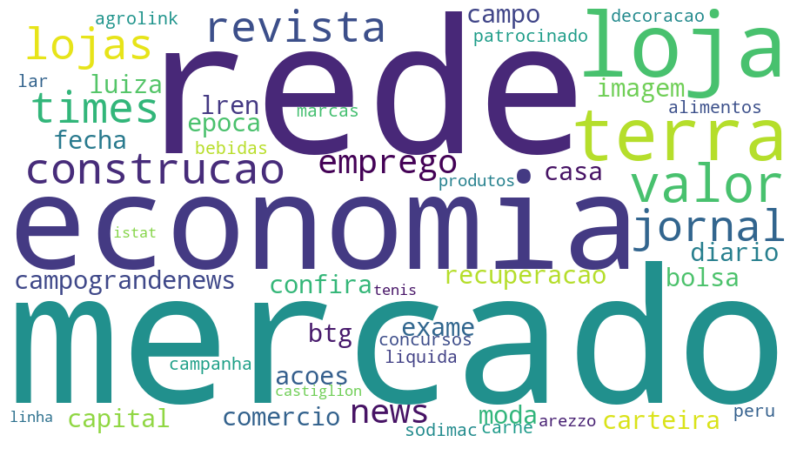

In [49]:
plot_wordcloud(data['all_keywords']) #grafico em nuvem dos dados que passaram pela run_tfidf

In [50]:
plot_term_scatter(data, 'all_keywords') #grafico da frequencia dos dados que passaram pela run_tfidf

,words,count,pos
0,rede,4,NOUN
1,mercado,4,NOUN
2,valor,3,NOUN
3,terra,3,NOUN
4,economia,3,NOUN
46,exame,1,NOUN
47,alimentos,1,NOUN
48,comercio,1,NOUN
49,btg,1,PROPN
50,luiza,1,PROPN


## 4- Algoritmo da similaridade

In [51]:
result = []
for idx in range(targets.shape[0]):
    similarity = (len(set(client['keywords'][0]) & set(targets['keywords'][idx])) / float(len(set(client['keywords'][0]) | set(targets['keywords'][idx]))) * 100)
    result.append({'client_name': client['entity_name'][0],'target_name': targets['entity_name'][idx], 'similarity(%)': similarity})

df_result = pd.DataFrame.from_dict(result)
df_result = df_result.sort_values("similarity(%)", ascending = False)
df_result['similarity(%)'] = df_result['similarity(%)'].apply(lambda x: str(round(x,2)))

df_result = df_result.reset_index().drop(axis = 1, columns = 'index')
df_result.head(len(df_result))

,client_name,target_name,similarity(%)
0,Lojas Renner,Sodimac,20.0
1,Lojas Renner,Hortifruti Natural da Terra,13.33
2,Lojas Renner,Magazine Luiza,11.11
3,Lojas Renner,Arezzo,5.56
4,Lojas Renner,Lojas Leader,5.26
5,Lojas Renner,Leroy Merlin,5.26
6,Lojas Renner,PepsiCo,0.0


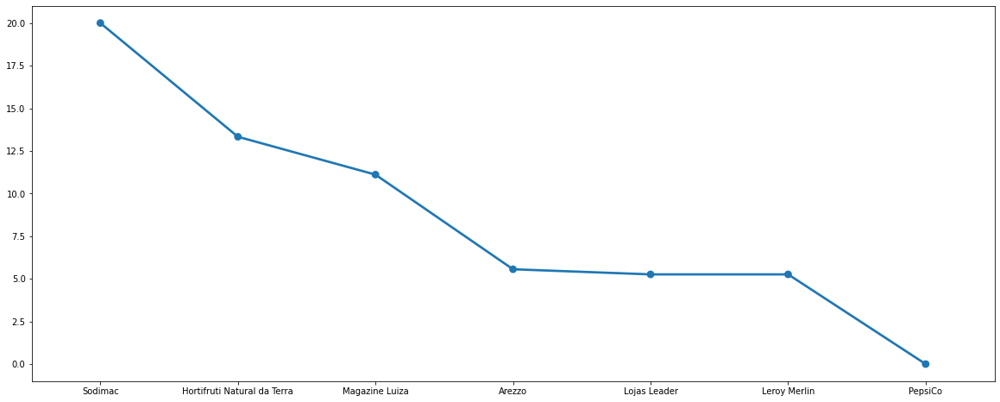

In [52]:
#grafico que mostra a comparação da similaridade entre os targets

columns_to_compare = df_result['target_name'].tolist()
comparison = pd.Series(df_result['similarity(%)'].values, index = columns_to_compare)

ax = sns.pointplot(x = comparison.index, y = comparison.values)
ax.figure.set_size_inches(20, 8)

## 5- Meus Insights

In [53]:
#comparando keywords de todo mundo com todo mundo

result = []
for idx in range(targets.shape[0]):
        for idy in range(idx+1,targets.shape[0]):
            #print(targets['entity_name'][idx], targets['keywords'][idx],"\n")
            similarity = (len(set(targets['keywords'][idy]) & set(targets['keywords'][idx])) / float(len(set(targets['keywords'][idy]) | set(targets['keywords'][idx]))) * 100)
            result.append({'client_name': targets['entity_name'][idy],'target_name': targets['entity_name'][idx], 'similarity(%)': similarity})
            
df_compared = pd.DataFrame.from_dict(result)
df_compared = df_compared.sort_values("similarity(%)", ascending = False)
df_compared['similarity(%)'] = df_compared['similarity(%)'].apply(lambda x: str(round(x,2)))

df_compared = df_compared.reset_index().drop(axis = 1, columns = 'index')
df_compared.head(len(df_compared))

,client_name,target_name,similarity(%)
0,Magazine Luiza,Lojas Leader,17.65
1,Sodimac,Hortifruti Natural da Terra,15.38
2,Hortifruti Natural da Terra,Magazine Luiza,13.33
3,Hortifruti Natural da Terra,Lojas Leader,13.33
4,Sodimac,Leroy Merlin,12.5
5,Arezzo,Magazine Luiza,11.76
6,Hortifruti Natural da Terra,Leroy Merlin,6.25
7,Arezzo,PepsiCo,6.25
8,Sodimac,Magazine Luiza,5.88
9,PepsiCo,Magazine Luiza,5.88


## 6- Conclusão

Nesse desafio exploramos através de gráficos e códigos diversas maneiras de se fazer o pré-processamento de dados, porem o único implementado no algorítimo para comparar a similaridade foi somente o tf–idf, que trouxe bons resultados mesmo trabalhando com poucos dados. No futuro pretendo implementar e comparar qual dentre as formas de pré-processamento apresentadas têm a melhor agilidade e desempenho.

## 7- Referências

- https://github.com/fastai/course-nlp

- https://www.geeksforgeeks.org/python-word-similarity-using-spacy/?ref=rp

- https://www.geeksforgeeks.org/python-percentage-similarity-of-lists/

- https://spacy.io/usage/vectors-similarity

- https://hackernoon.com/compare-documents-similarity-using-python-or-nlp-0u3032eo
    
- https://scikit-learn.org/stable/modules/classes.html#module-sklearn.feature_extraction.text